https://thecleverprogrammer.com/2022/12/05/credit-score-classification-with-machine-learning/

In [37]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

In [38]:
credit_data1 = pd.read_csv(r"D:\WORK\datascience\practice\Credit-Score-Classification-with-Machine-Learning\Credit-Score-Data\Credit Score Data\train.csv")
credit_data1

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,21.465380,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.944960,266.0,No,49.574949,21.465380,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,21.465380,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,21.465380,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,21.465380,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,155625,37932,4,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,34.663572,378.0,No,35.104023,24.028477,High_spent_Large_value_payments,479.866228,Poor
99996,155626,37932,5,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,40.565631,379.0,No,35.104023,24.028477,High_spent_Medium_value_payments,496.651610,Poor
99997,155627,37932,6,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,380.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,155628,37932,7,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,381.0,No,35.104023,24.028477,Low_spent_Large_value_payments,319.164979,Standard


In [39]:
credit_data = credit_data1.dropna(subset=['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
                                         'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
                                         'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                                         'Credit_Mix', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
                                         'Credit_History_Age', 'Total_EMI_per_month',
                                         'Amount_invested_monthly', 'Monthly_Balance'])
credit_data

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,21.465380,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.944960,266.0,No,49.574949,21.465380,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,21.465380,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,21.465380,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,21.465380,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,155625,37932,4,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,34.663572,378.0,No,35.104023,24.028477,High_spent_Large_value_payments,479.866228,Poor
99996,155626,37932,5,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,40.565631,379.0,No,35.104023,24.028477,High_spent_Medium_value_payments,496.651610,Poor
99997,155627,37932,6,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,380.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,155628,37932,7,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,381.0,No,35.104023,24.028477,Low_spent_Large_value_payments,319.164979,Standard


In [40]:
credit_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

In [41]:
credit_data.isnull().sum()

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [42]:
credit_data['Type_of_Loan'].value_counts()

No Data                                                                                                                               11408
Not Specified                                                                                                                          1408
Credit-Builder Loan                                                                                                                    1280
Personal Loan                                                                                                                          1272
Debt Consolidation Loan                                                                                                                1264
                                                                                                                                      ...  
Not Specified, Mortgage Loan, Auto Loan, and Payday Loan                                                                                  8
Payday Loan, Mortgag

In [43]:
credit_data['Payment_of_Min_Amount'].value_counts()

Yes    52326
No     35667
NM     12007
Name: Payment_of_Min_Amount, dtype: int64

In [44]:
credit_data['Credit_Score'].value_counts()

Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

In [45]:
credit_data['Credit_Mix'].value_counts()

Standard    45848
Good        30384
Bad         23768
Name: Credit_Mix, dtype: int64

occupation of the person affects credit scores

In [46]:
fig = px.box(
    credit_data,
    x = 'Occupation',
    color ='Credit_Score',
    title= 'credit score based on occupation',
    color_discrete_map={ 
                        'good' : 'green',
                        'standard' : 'yellow',
                        'poor' : 'red'}
)

fig.show()

explore whether the Annual Income of the person impacts your credit scores or not

In [47]:
fig = px.box(
    credit_data,
    x = 'Credit_Score',
    y = 'Annual_Income',
    color = 'Credit_Score',
    color_discrete_map= {
                          'good' : 'green',
                        'standard' : 'yellow',
                        'poor' : 'red'}
)

fig.update_traces(quartilemethod = 'exclusive')

fig.show()

explore whether the monthly in-hand salary impacts credit scores or not

In [48]:
fig = px.box(
    credit_data,
      x = 'Credit_Score',
    y = 'Monthly_Inhand_Salary',
    color = 'Credit_Score',
    color_discrete_map= {
                          'good' : 'green',
                        'standard' : 'yellow',
                        'poor' : 'red'}
)

fig.update_traces(quartilemethod = 'exclusive')

fig.show()

Credit Score Classification Model


In [49]:
credit_data['Credit_Mix'].value_counts()

Standard    45848
Good        30384
Bad         23768
Name: Credit_Mix, dtype: int64

linear Regression

Shape of X: (100000, 15)
Shape of y: (100000,)
Intercept (bias): 1.202016648278272
Coefficient (slope): [ 4.01416419e-06 -4.97188795e-05 -2.35146897e-03 -4.76926185e-02
 -1.54503323e-02 -1.51703456e-02 -5.20315916e-03  2.71788772e-03
  1.60145753e-01  2.84591765e-05 -3.13021445e-04  4.47010345e-04
  4.26306966e-04  4.03356295e-05 -7.00184642e-05]
Mean Squared Error on Test Data: 0.3164
mean_absolute_error : 0.4440
r2_score: 0.3084


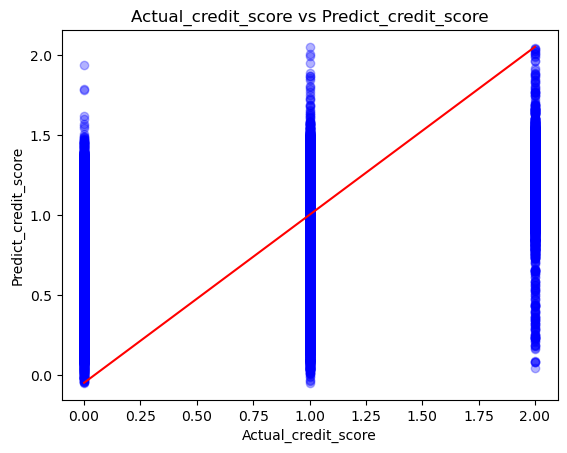

In [50]:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
credit_data = credit_data1.dropna(subset=['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
                                         'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
                                         'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                                         'Credit_Mix', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
                                         'Credit_History_Age', 'Total_EMI_per_month',
                                         'Amount_invested_monthly', 'Monthly_Balance'])

credit_data['Credit_Mix'] = credit_data['Credit_Mix'].map({'Standard' : 1,
                                                           'Good' : 2,
                                                           'Bad' : 0})
credit_data['Credit_Score'] = credit_data['Credit_Score'].map({'Standard' : 1,
                                                           'Good' : 2,
                                                           'Poor' : 0})

x = np.array(credit_data[['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                          'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
                          'Num_of_Delayed_Payment', 'Credit_Mix', 'Outstanding_Debt',
                          'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month',
                          'Amount_invested_monthly', 'Monthly_Balance']])

y = np.array(credit_data['Credit_Score'])
print(f"Shape of X: {x.shape}")
print(f"Shape of y: {y.shape}")

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Initialize the Linear Regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Predict on test data
y_pred = model.predict(X_test)

# Print the learned parameters
print(f"Intercept (bias): {model.intercept_}")
print(f"Coefficient (slope): {model.coef_}")

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error on Test Data: {mse:.4f}")
print(f'mean_absolute_error : {mae:.4f}')
print(f'r2_score: {r2 :.4f}')


plt.scatter(y_test, y_pred, color = 'blue', alpha=0.3)
plt.plot([min(y_test), max(y_test)], [min(y_pred), max(y_pred)], color='red')
plt.title('Actual_credit_score vs Predict_credit_score')
plt.xlabel('Actual_credit_score')
plt.ylabel('Predict_credit_score')
plt.show()

Random Forest Classification

In [51]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, mean_absolute_error, mean_squared_error, r2_score,confusion_matrix

credit_data = credit_data1.dropna(subset=['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
                                         'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
                                         'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                                         'Credit_Mix', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
                                         'Credit_History_Age', 'Total_EMI_per_month',
                                         'Amount_invested_monthly', 'Monthly_Balance'])

credit_data['Credit_Mix'] = credit_data['Credit_Mix'].map({'Standard' : 1,
                                                           'Good' : 2,
                                                           'Bad' : 0})
#credit_data['Credit_Score'] = credit_data['Credit_Score'].map({'Standard' : 1,
#                                                           'Good' : 2,
 #                                                          'Poor' : 0})

x = np.array(credit_data[['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                          'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
                          'Num_of_Delayed_Payment', 'Credit_Mix', 'Outstanding_Debt',
                          'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month',
                          'Amount_invested_monthly', 'Monthly_Balance']])

y = np.array(credit_data['Credit_Score'])

xtrain, xtest,ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=42)
print(ytest)
model = RandomForestClassifier()

model.fit(xtrain, ytrain)

ypred = model.predict(xtest)
print(ypred)

cm = confusion_matrix(ytest, ypred)
print(classification_report(ytest, ypred))
print('Accuracy:', accuracy_score(ytest, ypred))
print('confusionmatrix: ',cm)


['Good' 'Poor' 'Good' ... 'Poor' 'Poor' 'Poor']
['Good' 'Poor' 'Standard' ... 'Poor' 'Standard' 'Poor']
              precision    recall  f1-score   support

        Good       0.78      0.77      0.77      5322
        Poor       0.80      0.84      0.82      8805
    Standard       0.83      0.81      0.82     15873

    accuracy                           0.81     30000
   macro avg       0.80      0.81      0.80     30000
weighted avg       0.81      0.81      0.81     30000

Accuracy: 0.8114666666666667
confusionmatrix:  [[ 4102    23  1197]
 [   26  7383  1396]
 [ 1162  1852 12859]]


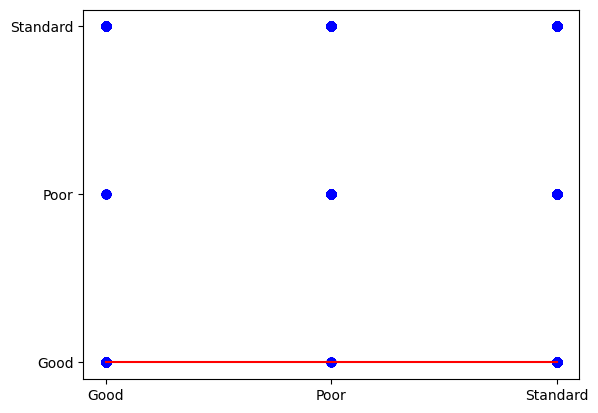

In [52]:
plt.scatter(ytest,ypred,color = 'blue')

plt.plot([min(ytest),max(ytest)], [min(ypred), min(ypred)], color='red')

plt.show()

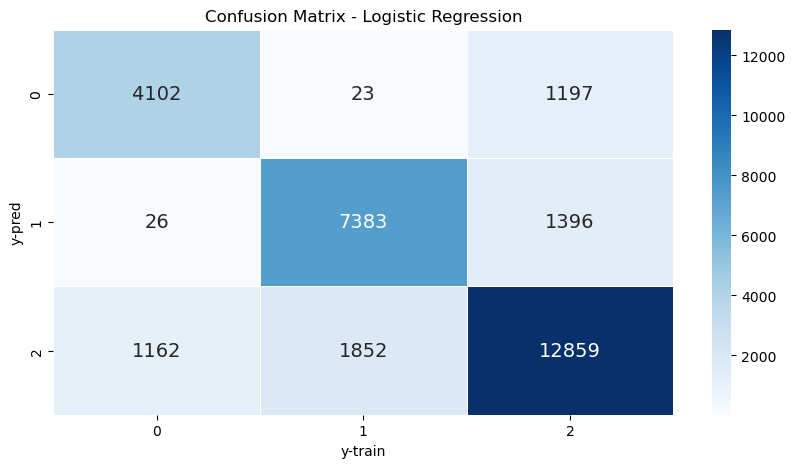

In [53]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.heatmap(cm,annot=True, fmt='d', cmap='Blues', cbar=True,
            annot_kws={'fontsize': 14}, linewidths=0.5 )
plt.title('Confusion Matrix - Logistic Regression')
plt.xlabel('y-train')
plt.ylabel('y-pred')

plt.show()


c:\Users\jagad\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



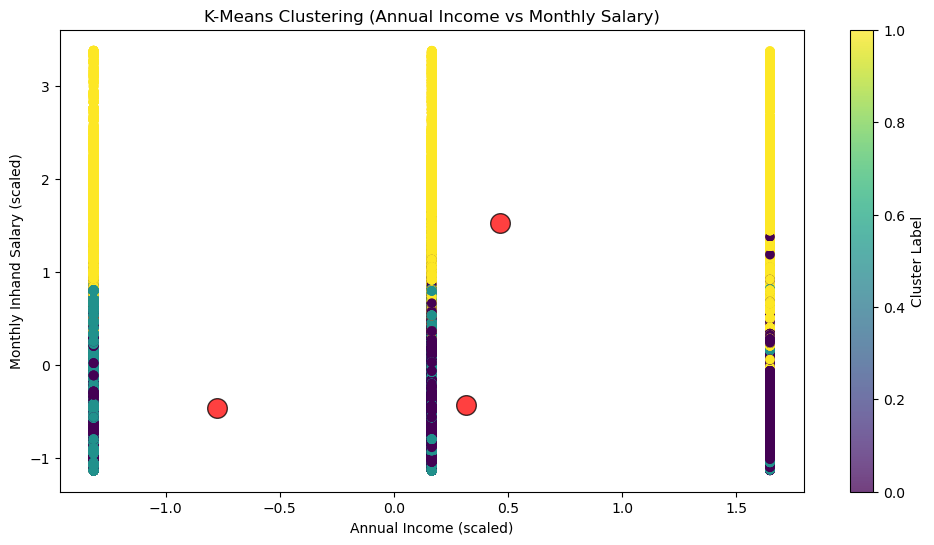

In [54]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

credit_data = credit_data1.dropna(subset=['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
                                         'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
                                         'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                                         'Credit_Mix', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
                                         'Credit_History_Age', 'Total_EMI_per_month',
                                         'Amount_invested_monthly', 'Monthly_Balance'])

credit_data['Credit_Mix'] = credit_data['Credit_Mix'].map({'Standard' : 1,
                                                          'Good' : 2,
                                                        'Bad' : 0})
credit_data['Credit_Score'] = credit_data['Credit_Score'].map({'Standard' : 1,
                                                           'Good' : 2,
                                                         'Poor' : 0})

x = np.array(credit_data[['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
                                         'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
                                         'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                                         'Credit_Mix', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
                                         'Credit_History_Age', 'Total_EMI_per_month',
                                         'Amount_invested_monthly', 'Monthly_Balance']])

y = np.array(credit_data['Credit_Score'])

# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(x)


# Apply K-Means
kmeans = KMeans(n_clusters=3, random_state=42)  # We expect 2 clusters: diabetic and non-diabetic
kmeans.fit(X_scaled)
y_kmeans = kmeans.predict(X_scaled)

plt.figure(figsize=(12, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1],c= y_kmeans, cmap='viridis')  # X_scaled[:, 0] is Annual_Income, X_scaled[:, 1] is Monthly_Inhand_Salary
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, edgecolor='black', label='Centroids')
plt.title('K-Means Clustering (Annual Income vs Monthly Salary)')
plt.xlabel('Annual Income (scaled)')
plt.ylabel('Monthly Inhand Salary (scaled)')
plt.colorbar(label='Cluster Label')  
plt.show()

           ID  Customer_ID  Month           Name   Age          SSN  \
0        5634         3392      1  Aaron Maashoh  23.0  821000265.0   
1        5635         3392      2  Aaron Maashoh  23.0  821000265.0   
2        5636         3392      3  Aaron Maashoh  23.0  821000265.0   
3        5637         3392      4  Aaron Maashoh  23.0  821000265.0   
4        5638         3392      5  Aaron Maashoh  23.0  821000265.0   
...       ...          ...    ...            ...   ...          ...   
99995  155625        37932      4          Nicks  25.0   78735990.0   
99996  155626        37932      5          Nicks  25.0   78735990.0   
99997  155627        37932      6          Nicks  25.0   78735990.0   
99998  155628        37932      7          Nicks  25.0   78735990.0   
99999  155629        37932      8          Nicks  25.0   78735990.0   

      Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
0      Scientist       19114.12            1824.843333                

c:\Users\jagad\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



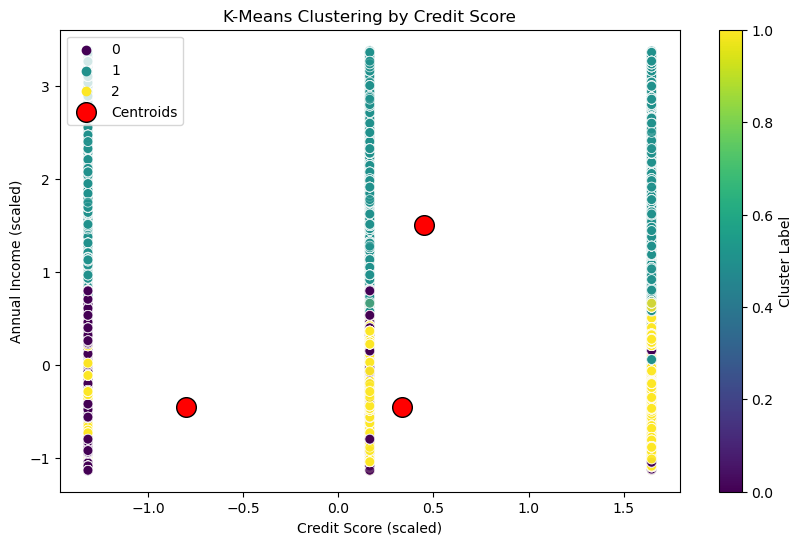

                   ID   Customer_ID     Month        Age           SSN  \
Cluster                                                                  
0        80665.876529  26095.694537  4.491407  29.898608  5.007432e+08   
1        80307.544533  26076.719513  4.523302  35.256149  4.966424e+08   
2        80774.161638  25853.970850  4.494081  34.741010  5.022314e+08   

         Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
Cluster                                                            
0         33109.885779            2754.896958           7.729631   
1        108195.006799            8986.173506           3.930526   
2         33098.785922            2751.198359           4.435447   

         Num_Credit_Card  Interest_Rate  ...  Num_of_Delayed_Payment  \
Cluster                                  ...                           
0               7.392617      23.831964  ...               18.297121   
1               4.580047       9.349141  ...               10.016268   


C:\Users\jagad\AppData\Local\Temp\ipykernel_20036\872880613.py:48: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [55]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Filter relevant features, including Credit_Score
features = ['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
            'Num_Bank_Accounts', 'Num_Credit_Card', 'Outstanding_Debt', 
            'Total_EMI_per_month', 'Credit_Utilization_Ratio']

# Drop rows with NaN and map categorical data if needed
credit_data = credit_data1.dropna(subset=features)
credit_data['Credit_Score'] = credit_data['Credit_Score'].map({'Poor': 0, 'Standard': 1, 'Good': 2})
print(credit_data)
# Select features for clustering
x = credit_data[features].values
# Standardize the features
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
credit_data['Cluster'] = kmeans.fit_predict(x_scaled)

# Analyze cluster centers
cluster_centers = kmeans.cluster_centers_

# Plot the clusters (e.g., based on Credit Score and one other feature)
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=x_scaled[:, 0],  # Credit_Score (scaled)
    y=x_scaled[:, 1],  # Annual Income (scaled)
    hue=credit_data['Cluster'],  # Cluster labels
    palette='viridis',
    s=50,
    alpha=0.8
)
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', s=200, label='Centroids', edgecolor='black')
plt.title('K-Means Clustering by Credit Score')
plt.xlabel('Credit Score (scaled)')
plt.ylabel('Annual Income (scaled)')
plt.legend()
plt.colorbar(label='Cluster Label')
plt.show()

# Optional: Analyze cluster characteristics
cluster_summary = credit_data.groupby('Cluster').mean()
print(cluster_summary)


In [62]:
# Import necessary libraries
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

# Filter relevant features, including Credit_Score
features = ['Credit_Score', 'Annual_Income', 'Monthly_Inhand_Salary', 
            'Num_Bank_Accounts', 'Num_Credit_Card', 'Outstanding_Debt', 
            'Total_EMI_per_month', 'Credit_Utilization_Ratio']

# Drop rows with NaN and map categorical data if needed
credit_data = credit_data1.dropna(subset=features)

credit_data['Credit_Score'] = credit_data['Credit_Score'].map({'Poor': 0, 'Standard': 1, 'Good': 2})
print(credit_data)
# Select features for clustering
x = np.array(credit_data[features].values)

y = np.array(credit_data['Credit_Score'])

# Split the data into training and testing sets
X_test, X_train, Y_test, Y_train = train_test_split(x, y, test_size=0.3, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=3)

# Train the model
knn.fit(X_train, Y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(Y_test, y_pred))




           ID  Customer_ID  Month           Name   Age          SSN  \
0        5634         3392      1  Aaron Maashoh  23.0  821000265.0   
1        5635         3392      2  Aaron Maashoh  23.0  821000265.0   
2        5636         3392      3  Aaron Maashoh  23.0  821000265.0   
3        5637         3392      4  Aaron Maashoh  23.0  821000265.0   
4        5638         3392      5  Aaron Maashoh  23.0  821000265.0   
...       ...          ...    ...            ...   ...          ...   
99995  155625        37932      4          Nicks  25.0   78735990.0   
99996  155626        37932      5          Nicks  25.0   78735990.0   
99997  155627        37932      6          Nicks  25.0   78735990.0   
99998  155628        37932      7          Nicks  25.0   78735990.0   
99999  155629        37932      8          Nicks  25.0   78735990.0   

      Occupation  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
0      Scientist       19114.12            1824.843333                

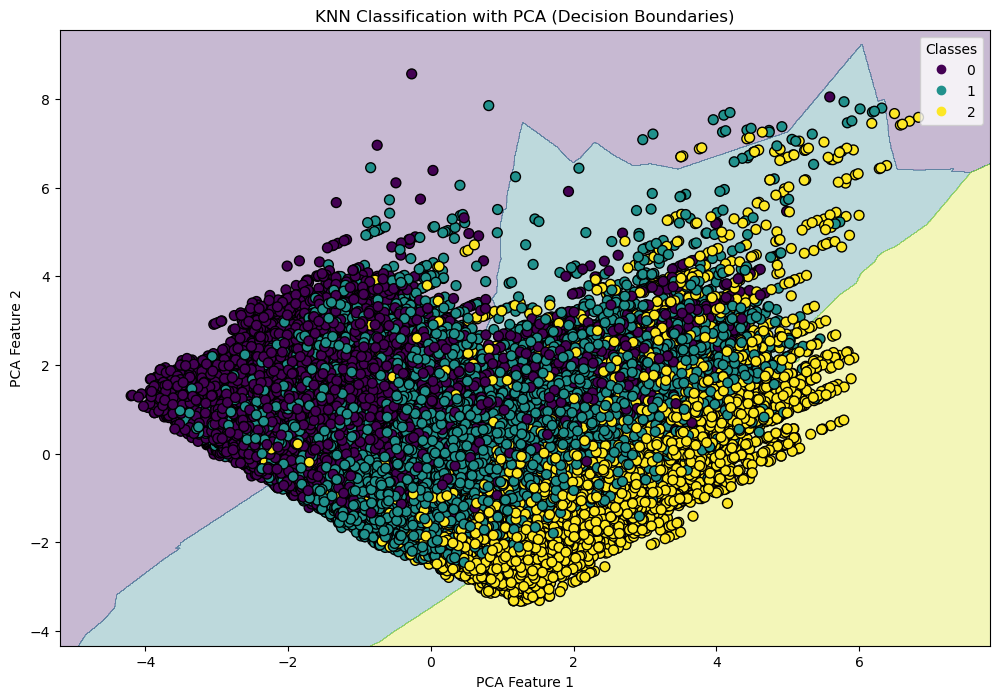

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions to 2 for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Combine train and test for visualization
X_combined_pca = np.vstack((X_train_pca, X_test_pca))
Y_combined = np.hstack((Y_train, Y_test))

# Define a mesh grid for plotting decision boundaries
x_min, x_max = X_combined_pca[:, 0].min() - 1, X_combined_pca[:, 0].max() + 1
y_min, y_max = X_combined_pca[:, 1].min() - 1, X_combined_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))

# Predict class for each point in the mesh grid
Z = knn.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

# Plot decision boundaries
plt.figure(figsize=(12, 8))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')

# Plot training and test points
scatter = plt.scatter(X_combined_pca[:, 0], X_combined_pca[:, 1], c=Y_combined, cmap='viridis', edgecolor='k', s=50)
plt.title('KNN Classification with PCA (Decision Boundaries)')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.legend(*scatter.legend_elements(), title="Classes")
plt.show()


In [64]:
import numpy as np

import pandas as pd

from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier, export_text

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


# Sample Dataset

data = pd.DataFrame({

'Feature1': [1, 2, 3, 4, 5],

'Feature2': [2, 4, 6, 8, 10],

'Target': [0, 0, 1, 1, 1]

})


# Features and Target

X = data[['Feature1', 'Feature2']]

y = data['Target']


# Train-Test Split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize Decision Tree Classifier

tree = DecisionTreeClassifier(max_depth=3, random_state=42)


# Train the Model

tree.fit(X_train, y_train)


# Predictions

y_pred = tree.predict(X_test)


# Evaluation

accuracy = accuracy_score(y_test, y_pred)

conf_matrix = confusion_matrix(y_test, y_pred)

class_report = classification_report(y_test, y_pred)


print(f"Accuracy: {accuracy}")

print("Confusion Matrix:")

print(conf_matrix)

print("Classification Report:")

print(class_report)


# Visualize the Decision Tree

print(export_text(tree, feature_names=['Feature1', 'Feature2']))

Accuracy: 1.0
Confusion Matrix:
[[1]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1

    accuracy                           1.00         1
   macro avg       1.00      1.00      1.00         1
weighted avg       1.00      1.00      1.00         1

|--- Feature1 <= 2.00
|   |--- class: 0
|--- Feature1 >  2.00
|   |--- class: 1

